# <I><U><U>NBA PLAYERS CAREER DURATION

### <B>Objective:
    
    To construct a model that can forecast the career duration for NBA Players on the basis of different variables and to  determine which factors facilitates most in the success of a startup.
    

### Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt
import seaborn as sns
from datetime import date
from scipy import stats
from scipy.stats import norm, skew 
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.colors import n_colors
from plotly.subplots import make_subplots
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler as ss
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from skopt import BayesSearchCV 
from skopt.space import Real, Categorical, Integer
from xgboost.sklearn import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import Normalizer
from sklearn.metrics import accuracy_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import make_scorer
from sklearn.metrics import mean_squared_error
import time
import gc
import warnings
warnings.filterwarnings("ignore")

In [2]:
data = pd.read_csv("/Users/gauravsharma/Documents/BDDA/data_files/nba-players.csv")

# Data Exploration

In [3]:
data.head(5)

,Unnamed: 0,name,gp,min,pts,fgm,fga,fg,3p_made,3pa,...,fta,ft,oreb,dreb,reb,ast,stl,blk,tov,target_5yrs
0,0,Brandon Ingram,36,27.4,7.4,2.6,7.6,34.7,0.5,2.1,...,2.3,69.9,0.7,3.4,4.1,1.9,0.4,0.4,1.3,0
1,1,Andrew Harrison,35,26.9,7.2,2.0,6.7,29.6,0.7,2.8,...,3.4,76.5,0.5,2.0,2.4,3.7,1.1,0.5,1.6,0
2,2,JaKarr Sampson,74,15.3,5.2,2.0,4.7,42.2,0.4,1.7,...,1.3,67.0,0.5,1.7,2.2,1.0,0.5,0.3,1.0,0
3,3,Malik Sealy,58,11.6,5.7,2.3,5.5,42.6,0.1,0.5,...,1.3,68.9,1.0,0.9,1.9,0.8,0.6,0.1,1.0,1
4,4,Matt Geiger,48,11.5,4.5,1.6,3.0,52.4,0.0,0.1,...,1.9,67.4,1.0,1.5,2.5,0.3,0.3,0.4,0.8,1


In [4]:
# Data Shape
data.shape

(1340, 22)

In [5]:
# Data Size
data.size

29480

In [6]:
# Description
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1340 entries, 0 to 1339
Data columns (total 22 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Unnamed: 0   1340 non-null   int64  
 1   name         1340 non-null   object 
 2   gp           1340 non-null   int64  
 3   min          1340 non-null   float64
 4   pts          1340 non-null   float64
 5   fgm          1340 non-null   float64
 6   fga          1340 non-null   float64
 7   fg           1340 non-null   float64
 8   3p_made      1340 non-null   float64
 9   3pa          1340 non-null   float64
 10  3p           1340 non-null   float64
 11  ftm          1340 non-null   float64
 12  fta          1340 non-null   float64
 13  ft           1340 non-null   float64
 14  oreb         1340 non-null   float64
 15  dreb         1340 non-null   float64
 16  reb          1340 non-null   float64
 17  ast          1340 non-null   float64
 18  stl          1340 non-null   float64
 19  blk   

In [7]:
data.columns

Index(['Unnamed: 0', 'name', 'gp', 'min', 'pts', 'fgm', 'fga', 'fg', '3p_made',
       '3pa', '3p', 'ftm', 'fta', 'ft', 'oreb', 'dreb', 'reb', 'ast', 'stl',
       'blk', 'tov', 'target_5yrs'],
      dtype='object')

In [8]:
n = data.nunique(axis=0)
  
print("No.of.unique values in each column :\n",
      n)

No.of.unique values in each column :
 Unnamed: 0     1340
name           1294
gp               70
min             325
pts             191
fgm              87
fga             159
fg              284
3p_made          23
3pa              54
3p              254
ftm              59
fta              76
ft              383
oreb             44
dreb             74
reb             101
ast              77
stl              26
blk              28
tov              41
target_5yrs       2
dtype: int64


## Exploratory Data Analysis and Developing Insights with Data Visualization:

<b> Statistical Summary

In [9]:
data.describe()

,Unnamed: 0,gp,min,pts,fgm,fga,fg,3p_made,3pa,3p,...,fta,ft,oreb,dreb,reb,ast,stl,blk,tov,target_5yrs
count,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,...,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000
mean,669.500000,60.414179,17.624627,6.801493,2.629104,5.885299,44.169403,0.247612,0.779179,19.149627,...,1.821940,70.300299,1.009403,2.025746,3.034478,1.550522,0.618507,0.368582,1.193582,0.620149
std,386.968991,17.433992,8.307964,4.357545,1.683555,3.593488,6.137679,0.383688,1.061847,16.051861,...,1.322984,10.578479,0.777119,1.360008,2.057774,1.471169,0.409759,0.429049,0.722541,0.485531
min,0.000000,11.000000,3.100000,0.700000,0.300000,0.800000,23.800000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.200000,0.300000,0.000000,0.000000,0.000000,0.100000,0.000000
25%,334.750000,47.000000,10.875000,3.700000,1.400000,3.300000,40.200000,0.000000,0.000000,0.000000,...,0.900000,64.700000,0.400000,1.000000,1.500000,0.600000,0.300000,0.100000,0.700000,0.000000
50%,669.500000,63.000000,16.100000,5.550000,2.100000,4.800000,44.100000,0.100000,0.300000,22.200000,...,1.500000,71.250000,0.800000,1.700000,2.500000,1.100000,0.500000,0.200000,1.000000,1.000000
75%,1004.250000,77.000000,22.900000,8.800000,3.400000,7.500000,47.900000,0.400000,1.200000,32.500000,...,2.300000,77.600000,1.400000,2.600000,4.000000,2.000000,0.800000,0.500000,1.500000,1.000000
max,1339.000000,82.000000,40.900000,28.200000,10.200000,19.800000,73.700000,2.300000,6.500000,100.000000,...,10.200000,100.000000,5.300000,9.600000,13.900000,10.600000,2.500000,3.900000,4.400000,1.000000


<B>Missing Values

In [10]:
data.isnull().sum()

Unnamed: 0     0
name           0
gp             0
min            0
pts            0
fgm            0
fga            0
fg             0
3p_made        0
3pa            0
3p             0
ftm            0
fta            0
ft             0
oreb           0
dreb           0
reb            0
ast            0
stl            0
blk            0
tov            0
target_5yrs    0
dtype: int64

In [11]:
# Lable encoding data
data = data.apply(LabelEncoder().fit_transform)

<B>Correlation Heatmap

In [12]:
data.corr()

,Unnamed: 0,name,gp,min,pts,fgm,fga,fg,3p_made,3pa,...,fta,ft,oreb,dreb,reb,ast,stl,blk,tov,target_5yrs
Unnamed: 0,1.000000,-0.039705,-0.023357,0.113935,0.049678,0.026591,0.042305,-0.043514,0.210397,0.209513,...,0.048605,-0.016957,0.035029,0.074617,0.062718,-0.005615,0.039609,0.066713,0.015518,0.070700
name,-0.039705,1.000000,0.014958,0.015864,0.021059,0.024665,0.028768,-0.013305,0.019164,0.020782,...,-0.007954,0.067659,-0.016918,-0.028877,-0.025340,0.039338,0.037024,-0.018026,0.015133,-0.015747
gp,-0.023357,0.014958,1.000000,0.595278,0.553215,0.545082,0.525129,0.305199,0.107428,0.099020,...,0.486983,0.187361,0.402321,0.471840,0.467482,0.381567,0.451504,0.282431,0.519972,0.396803
min,0.113935,0.015864,0.595278,1.000000,0.918575,0.900718,0.912748,0.211926,0.386307,0.398492,...,0.781102,0.239981,0.574877,0.751072,0.716182,0.631819,0.754751,0.407543,0.822213,0.318327
pts,0.049678,0.021059,0.553215,0.918575,1.000000,0.990044,0.981064,0.266938,0.356095,0.363955,...,0.874706,0.270280,0.576926,0.695353,0.678233,0.565957,0.679632,0.383174,0.849169,0.323368
fgm,0.026591,0.024665,0.545082,0.900718,0.990044,1.000000,0.979157,0.298858,0.291858,0.300305,...,0.842918,0.227206,0.598149,0.703134,0.690746,0.542095,0.662213,0.399211,0.835412,0.318471
fga,0.042305,0.028768,0.525129,0.912748,0.981064,0.979157,1.000000,0.136635,0.394464,0.415960,...,0.805749,0.280164,0.506916,0.644301,0.618000,0.601655,0.692026,0.324929,0.844765,0.296017
fg,-0.043514,-0.013305,0.305199,0.211926,0.266938,0.298858,0.136635,1.000000,-0.303767,-0.362346,...,0.309500,-0.172586,0.525680,0.421601,0.481282,-0.114504,0.058646,0.412554,0.128258,0.228166
3p_made,0.210397,0.019164,0.107428,0.386307,0.356095,0.291858,0.394464,-0.303767,1.000000,0.982334,...,0.099238,0.331074,-0.219641,0.019708,-0.070205,0.383444,0.307086,-0.161681,0.256908,0.036504
3pa,0.209513,0.020782,0.099020,0.398492,0.363955,0.300305,0.415960,-0.362346,0.982334,1.000000,...,0.110057,0.342872,-0.234025,0.013720,-0.079456,0.414873,0.336464,-0.175936,0.279224,0.016573


(22.5, -0.5)

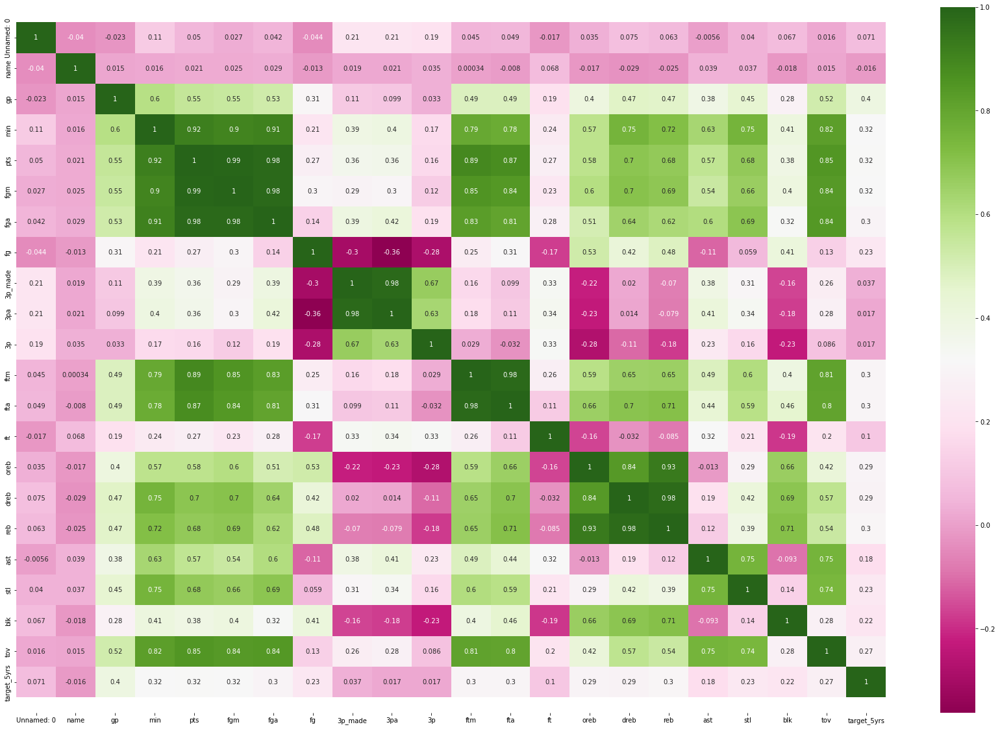

In [13]:
plt.figure(figsize=(30,20))
ax = sns.heatmap(data = data.corr(),cmap='PiYG',annot=True)

bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5,top - 0.5)

<b> Scatter Plot

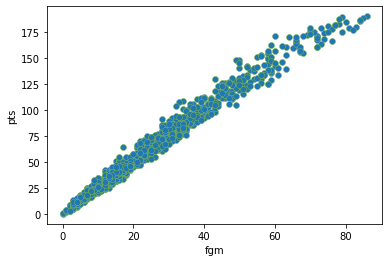

In [14]:
fig, ax = plt.subplots()
_ = plt.scatter(x=data['fgm'], y=data['pts'], edgecolors='#7eb54e', linewidths= 0.5)
_ = ax.set(xlabel="fgm", ylabel="pts")

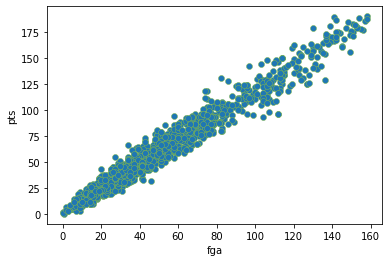

In [15]:
fig, ax = plt.subplots()
_ = plt.scatter(x=data['fga'], y=data['pts'], edgecolors='#7eb54e', linewidths= 0.5)
_ = ax.set(xlabel="fga", ylabel="pts")

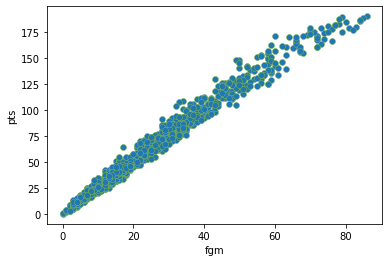

In [16]:
fig, ax = plt.subplots()
_ = plt.scatter(x=data['fgm'], y=data['pts'], edgecolors='#7eb54e', linewidths= 0.5)
_ = ax.set(xlabel="fgm", ylabel="pts")

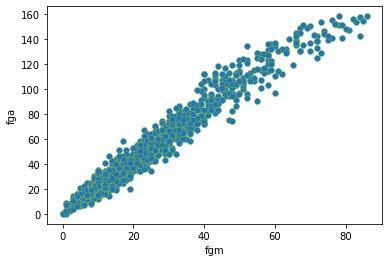

In [17]:
fig, ax = plt.subplots()
_ = plt.scatter(x=data['fgm'], y=data['fga'], edgecolors='#7eb54e', linewidths= 0.5)
_ = ax.set(xlabel="fgm", ylabel="fga")

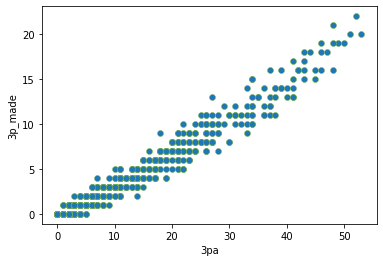

In [18]:
fig, ax = plt.subplots()
_ = plt.scatter(x=data['3pa'], y=data['3p_made'], edgecolors='#7eb54e', linewidths= 0.5)
_ = ax.set(xlabel="3pa", ylabel="3p_made")

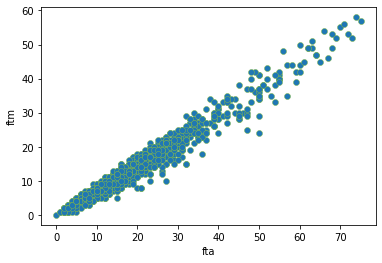

In [19]:
fig, ax = plt.subplots()
_ = plt.scatter(x=data['fta'], y=data['ftm'], edgecolors='#7eb54e', linewidths= 0.5)
_ = ax.set(xlabel="fta", ylabel="ftm")

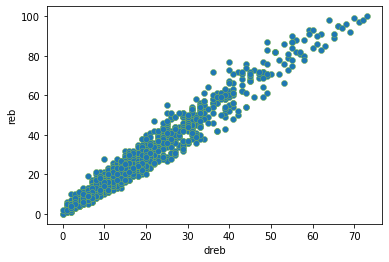

In [20]:
fig, ax = plt.subplots()
_ = plt.scatter(x=data['dreb'], y=data['reb'], edgecolors='#7eb54e', linewidths= 0.5)
_ = ax.set(xlabel="dreb", ylabel="reb")

Field Goals Attempted

Text(0.5, 0, 'Field Goals Attempted')

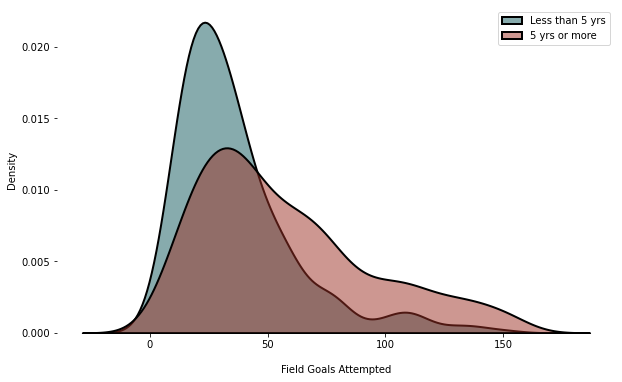

In [21]:
fig, ax = plt.subplots(figsize=(10,6))

sns.kdeplot(
    data['fga'][data['target_5yrs'] == 0],
    color = '#11585D',
    alpha = 0.5,
    shade = True,
    linewidth = 2,
    ec = 'black'
)

sns.kdeplot(
    data['fga'][data['target_5yrs'] == 1],
    color = '#9C3025',
    alpha = 0.5,
    shade = True,
    linewidth = 2,
    ec = 'black'
)

for i in ['top', 'left', 'bottom', 'right']:
    ax.spines[i].set_visible(False)

ax.set_xlabel
ax.legend(['Less than 5 yrs', '5 yrs or more'])
ax.set_xlabel('Field Goals Attempted', labelpad = 15)



Observing players with year durations

(-1.113047469373596,
 1.119926857139821,
 -1.1700163570343494,
 1.1157441185865908)

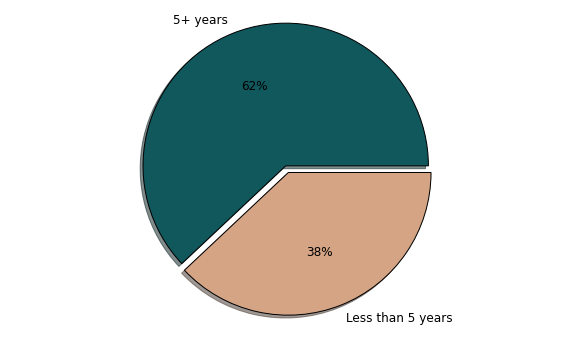

In [22]:
fig, ax = plt.subplots(figsize=(10,6))


labels = ["5+ years", "Less than 5 years"]
colors = ['#11585D', '#D4A485']
sizes = data['target_5yrs'].value_counts()

plt.pie(sizes, explode = [0, 0.05], labels = labels, colors = colors,
        autopct = '%1.0f%%', shadow = True, wedgeprops = {'ec': 'black'},
        textprops = {'fontsize': 12}
)

plt.axis('equal')

## Feature Engineering (creating new features)


In [23]:
data.columns

Index(['Unnamed: 0', 'name', 'gp', 'min', 'pts', 'fgm', 'fga', 'fg', '3p_made',
       '3pa', '3p', 'ftm', 'fta', 'ft', 'oreb', 'dreb', 'reb', 'ast', 'stl',
       'blk', 'tov', 'target_5yrs'],
      dtype='object')

<B>Creating feature

In [24]:
# Creating a new feature of player performance as 'perf' which reflects whether player is a good performer or not.
data['perf'] = np.where((data['fg'] >= data['fg'].mean()) | (data['target_5yrs'] == 1) | (data['3p'] >= data['3p'].mean()) | (data['ft'] >= data['ft'].mean()) | (data['reb'] >= data['reb'].mean()), 1, 0)
data["perf"] = pd.to_numeric(data["perf"])
data.head(5)

,Unnamed: 0,name,gp,min,pts,fgm,fga,fg,3p_made,3pa,...,ft,oreb,dreb,reb,ast,stl,blk,tov,target_5yrs,perf
0,0,128,23,229,66,23,67,44,5,21,...,198,7,32,38,19,4,4,12,0,1
1,1,45,22,224,64,17,58,9,7,28,...,264,5,18,21,37,11,5,15,0,1
2,2,521,61,110,44,17,38,118,4,17,...,169,5,15,19,10,5,3,9,0,0
3,3,820,45,73,49,20,46,122,1,5,...,188,10,7,16,8,6,1,9,1,1
4,4,871,35,72,37,13,21,220,0,1,...,173,10,13,22,3,3,4,7,1,1


<B>Dropping features

In [25]:
data.drop(columns = ['fgm', 'fga', '3p_made', '3pa', 'ftm', 'fta', 'oreb', 'dreb'], inplace = True)
data.head(5)

,Unnamed: 0,name,gp,min,pts,fg,3p,ft,reb,ast,stl,blk,tov,target_5yrs,perf
0,0,128,23,229,66,44,81,198,38,19,4,4,12,0,1
1,1,45,22,224,64,9,71,264,21,37,11,5,15,0,1
2,2,521,61,110,44,118,77,169,19,10,5,3,9,0,0
3,3,820,45,73,49,122,65,188,16,8,6,1,9,1,1
4,4,871,35,72,37,220,0,173,22,3,3,4,7,1,1


In [26]:
# Re-odering columns
data = data[['Unnamed: 0', 'name', 'gp', 'min', 'pts', 'fg', '3p', 'ft', 'reb',
       'ast', 'stl', 'blk', 'tov', 'perf', 'target_5yrs']]

data.head(5)

,Unnamed: 0,name,gp,min,pts,fg,3p,ft,reb,ast,stl,blk,tov,perf,target_5yrs
0,0,128,23,229,66,44,81,198,38,19,4,4,12,1,0
1,1,45,22,224,64,9,71,264,21,37,11,5,15,1,0
2,2,521,61,110,44,118,77,169,19,10,5,3,9,0,0
3,3,820,45,73,49,122,65,188,16,8,6,1,9,1,1
4,4,871,35,72,37,220,0,173,22,3,3,4,7,1,1


## Discover if data possess any structure



In [27]:
# Selecting only numeric columns 
num_data = data.select_dtypes(include = ['int64']).copy()
num_data.columns

Index(['Unnamed: 0', 'name', 'gp', 'min', 'pts', 'fg', '3p', 'ft', 'reb',
       'ast', 'stl', 'blk', 'tov', 'perf', 'target_5yrs'],
      dtype='object')

In [28]:
cols = ['gp', 'min', 'pts', 'tov', 'perf', 'target_5yrs']

In [29]:
from sklearn.preprocessing import StandardScaler
ss= StandardScaler()
nc = ss.fit_transform(num_data.loc[:,cols])

In [30]:
nc.shape

(1340, 6)

In [31]:
nc = pd.DataFrame(nc, columns = cols)
nc.head(5)

,gp,min,pts,tov,perf,target_5yrs
0,-1.403556,1.207923,0.173282,0.149464,0.243492,-1.277737
1,-1.461022,1.145679,0.124108,0.567009,0.243492,-1.277737
2,0.780172,-0.273472,-0.367628,-0.268080,-4.106905,-1.277737
3,-0.139292,-0.734073,-0.244694,-0.268080,0.243492,0.782633
4,-0.713957,-0.746522,-0.539736,-0.546444,0.243492,0.782633


In [32]:
# Adding few columns that are discrete
# These columns were not to be scaled

nc['gp'] = data['gp']
nc['min'] = data['min']
nc['pts'] = data['pts']
nc['tov'] = data['tov']
nc['perf'] = data['perf']

In [33]:
# Creating a dataframe from random data for comparison:

rng = np.random.default_rng()
nc_rand = pd.DataFrame(rng.normal(size = (1340, 6)),
                       columns = cols )   

In [34]:
# 4.1 Add/overwrite these columns also
#
nc_rand['gp'] = np.random.randint(2,   size= (1340,))   # [0,1]
nc_rand['min']        = np.random.randint(2,   size= (1340,))   # [0,1]
nc_rand['pts']       = np.random.randint(1,4, size= (1340,))   # [1,2,3]
nc_rand['tov']     = np.random.randint(24,  size= (1340,))   # [0 to 23]
nc_rand['perf']       = np.random.randint(7,   size= (1340,))   # [0 to 6]

nc_rand.shape  

(1340, 6)

<b> Parallel coordinates plot

Text(0.5, 1.0, 'Parallel chart with ad data')

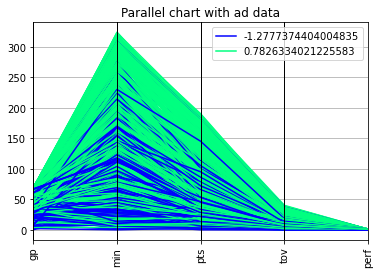

In [35]:
# Parallel coordinates with original data
fig2 = plt.figure()
ax = pd.plotting.parallel_coordinates(nc,
                                 'target_5yrs',
                                  colormap= plt.cm.winter
                                  )

plt.xticks(rotation=90)
plt.title("Parallel chart with ad data")

Text(0.5, 1.0, 'Parallel chart with random data')

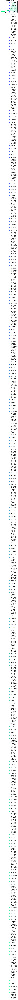

In [36]:
# Parallel coordinates with random data

fig1 = plt.figure()
pd.plotting.parallel_coordinates(nc_rand,
                                 'target_5yrs',    # class_column
                                  colormap='winter'
                                  )
plt.xticks(rotation=90)
plt.title("Parallel chart with random data")

<b>Andrews plot

Text(0.5, 1.0, 'Andrews curve with ad data')

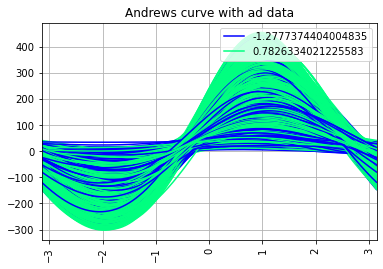

In [37]:
# 6.1 Andrews plots with original data
fig4 = plt.figure()
pd.plotting.andrews_curves(nc,
                           'target_5yrs',
                            colormap = plt.cm.winter
                           )
plt.xticks(rotation=90)
plt.title("Andrews curve with ad data")

Text(0.5, 1.0, 'Andrews plots with random data')

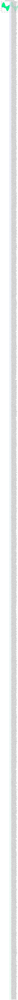

In [38]:
# 6.0 Andrews charts with random data
fig3 = plt.figure()
pd.plotting.andrews_curves(nc_rand,
                           'target_5yrs',
                           colormap = 'winter')

plt.title("Andrews plots with random data")

<b>Radviz plot

<AxesSubplot:>

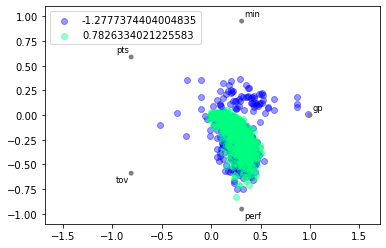

In [39]:
# Radviz plot with original data

fig5 = plt.figure()
pd.plotting.radviz(nc,
                   class_column ='target_5yrs',
                   colormap= plt.cm.winter,
                   alpha = 0.4
                   )

<AxesSubplot:>

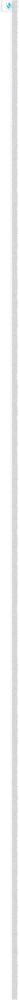

In [40]:
# Radviz plot with random data

fig5 = plt.figure()
pd.plotting.radviz(nc_rand,
                   class_column ='target_5yrs',
                   colormap= plt.cm.winter,
                   alpha = 0.4
                   )

## Data pipelining for Data Processing and Modeling

In [41]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1340 entries, 0 to 1339
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   Unnamed: 0   1340 non-null   int64
 1   name         1340 non-null   int64
 2   gp           1340 non-null   int64
 3   min          1340 non-null   int64
 4   pts          1340 non-null   int64
 5   fg           1340 non-null   int64
 6   3p           1340 non-null   int64
 7   ft           1340 non-null   int64
 8   reb          1340 non-null   int64
 9   ast          1340 non-null   int64
 10  stl          1340 non-null   int64
 11  blk          1340 non-null   int64
 12  tov          1340 non-null   int64
 13  perf         1340 non-null   int64
 14  target_5yrs  1340 non-null   int64
dtypes: int64(15)
memory usage: 157.2 KB


In [42]:
# Divide data into predictors and target
# First 14 columns are predictors

X = data.iloc[ :, 0:14]
X.head(2)

# 14th index or 15th column is target
print("\n\nTarget,y, values")
y = data.iloc[ : , 14]
y.head()



Target,y, values


0    0
1    0
2    0
3    1
4    1
Name: target_5yrs, dtype: int64

<b>Split data into train and test

In [43]:
# Split dataset into train and validation parts
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.20,
                                                    shuffle = True,
                                                    stratify = y
                                                    )      

In [44]:
X_train.shape

(1072, 14)

In [45]:
X_test.shape

(268, 14)

In [46]:
y_train.shape

(1072,)

In [47]:
y_test.shape

(268,)

In [48]:
# Storing column names somewhere for use in feature importance
colnames = X.columns.tolist()

<b> Creating a Pipeline

In [49]:

# Pipeline steps
# steps: List of (name, transform) tuples
#       (implementing fit/transform) that are
#       chained, in the order in which they
#       are chained, with the last object an
#       estimator.
#      Format: [(name, transformer), (name, transformer)..(name, estimator)]
from sklearn.preprocessing import StandardScaler as ss
steps_xg = [('sts', ss()),
            ('pca', PCA()),
            ('xg',  XGBClassifier(silent = False,
                                  n_jobs=3)        # Specify other parameters here
            )
            ]

# Instantiate Pipeline object

pipe_xg = Pipeline(steps_xg)

## Cross-Validation

<b>Grid Search code to discover best pipeline parameters

In [50]:
# Specify xgboost parameter-range
# Dictionary of parameters 
# Syntax: {
#          'transformerName__parameterName' : [ <listOfValues> ]
#              }
#
# What parameters in the pipe are available for tuning

print("\n\n--Which parameters can be tuned?--\n\n")
pipe_xg.get_params()



--Which parameters can be tuned?--




{'memory': None,
 'steps': [('sts', StandardScaler()),
  ('pca', PCA()),
  ('xg',
   XGBClassifier(base_score=None, booster=None, callbacks=None,
                 colsample_bylevel=None, colsample_bynode=None,
                 colsample_bytree=None, early_stopping_rounds=None,
                 enable_categorical=False, eval_metric=None, gamma=None,
                 gpu_id=None, grow_policy=None, importance_type=None,
                 interaction_constraints=None, learning_rate=None, max_bin=None,
                 max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
                 max_leaves=None, min_child_weight=None, missing=nan,
                 monotone_constraints=None, n_estimators=100, n_jobs=3,
                 num_parallel_tree=None, predictor=None, random_state=None,
                 reg_alpha=None, reg_lambda=None, ...))],
 'verbose': False,
 'sts': StandardScaler(),
 'pca': PCA(),
 'xg': XGBClassifier(base_score=None, booster=None, callbacks=None,
               c

Now that we know which parameters can be tuned, specify parameter space



In [51]:
#  Define dictionary
parameters = {'xg__learning_rate':  [0.03, 0.05], # learning rate decides what percentage
                                                  #  of error is to be fitted by
                                                  #   by next boosted tree.
                                                  # See this answer in stackoverflow:
                                                  # https://stats.stackexchange.com/questions/354484/why-does-xgboost-have-a-learning-rate
                                                  # Coefficients of boosted trees decide,
                                                  #  in the overall model or scheme, how much importance
                                                  #   each boosted tree shall have. Values of these
                                                  #    Coefficients are calculated by modeling
                                                  #     algorithm and unlike learning rate are
                                                  #      not hyperparameters. These Coefficients
                                                  #       get adjusted by l1 and l2 parameters
              'xg__n_estimators':   [200,  300],  # Number of boosted trees to fit
                                                  # l1 and l2 specifications will change
                                                  # the values of coeff of boosted trees
                                                  # but not their numbers

              'xg__max_depth':      [4,6],
              'pca__n_components' : [8,14],
              'xg__booster': ['gbtree','gblinear']
              }                               # Total: 2 * 2 * 2 * 2

In [52]:
# 6.3.1 Define revised dictionary
#       This takes 3.5 minutes
parameters = {'xg__learning_rate':  [0.03, 0.05], # learning rate decides what percentage
                                                  #  of error is to be fitted by
                                                  #   by next boosted tree.
                                                  # See this answer in stackoverflow:
                                                  # https://stats.stackexchange.com/questions/354484/why-does-xgboost-have-a-learning-rate
                                                  # Coefficients of boosted trees decide,
                                                  #  in the overall model or scheme, how much importance
                                                  #   each boosted tree shall have. Values of these
                                                  #    Coefficients are calculated by modeling
                                                  #     algorithm and unlike learning rate are
                                                  #      not hyperparameters. These Coefficients
                                                  #       get adjusted by l1 and l2 parameters
               'xg__max_depth':      [4,6],
 
              'pca__n_components' : [8,14],
               }                               # Total: 2 * 2 * 2 * 2

## Hyperparameter tuning both using Grid Search and Randomized Search

<b>Instantiate GridSearchCV class

<i><u>Note: Accuracy score is only for classification problems. For regression problems use: R2 Score, MSE (Mean Squared Error), RMSE (Root Mean Squared Error).

In [53]:
#define your own mse and set greater_is_better=False
mse = make_scorer(mean_squared_error,greater_is_better=False)

In [54]:
grid_obj = GridSearchCV(pipe_xg, 
                        parameters, 
                        cv=5,
                        scoring=mse,
                        n_jobs = -1, 
                        verbose=True)

In [55]:
del X
del data
del y
gc.collect()

15

<b>Model fitting

In [56]:
# Start fitting pipeline to data
print("\n\n--Takes time...---\n")
start = time.time()
grid_obj.fit(X_train, y_train)
end = time.time()
print()
(end - start)/60               



--Takes time...---

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[05:37:53] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.





0.056168230374654134

<b>Performance Scores

In [57]:
f"Best score: {grid_obj.best_score_} "         

'Best score: -0.28544229515322755 '

In [58]:
f"Best parameter set {grid_obj.best_params_}"

"Best parameter set {'pca__n_components': 14, 'xg__learning_rate': 0.05, 'xg__max_depth': 4}"

In [59]:
#Make predictions using the best returned model
y_pred = grid_obj.predict(X_test)
print("--Few predictions--\n")
y_pred[:4]



--Few predictions--



array([0, 1, 1, 0])

In [60]:
# Mean Squared Error
print("\n\n--mse--\n")
accuracy = mean_squared_error(y_test, y_pred)
accuracy * 100.0  



--mse--



29.1044776119403

<b>Feature importance



In [61]:
# Get feature importances from GridSearchCV best fitted 'xg' model

print("\n\n--How many features--\n")
grid_obj.best_estimator_.named_steps["xg"].feature_importances_.shape






--How many features--



(14,)

In [62]:
print("\n\n---Feature importances---\n")
grid_obj.best_estimator_.named_steps["xg"].feature_importances_



---Feature importances---



array([0.22477633, 0.06209529, 0.11924563, 0.04604933, 0.04817009,
       0.05660395, 0.05782697, 0.08725394, 0.05432433, 0.04188319,
       0.05229447, 0.04178743, 0.04154141, 0.06614762], dtype=float32)

In [63]:
# Create a dataframe of feature importances
# with names of columns and sorted by feature-imp
imp_values = grid_obj.best_estimator_.named_steps["xg"].feature_importances_

df_imp = pd.DataFrame(
                      data = imp_values,
                      index = colnames,
                      columns = ["imp"]
                      ).sort_values(by = 'imp')


df_imp

,imp
tov,0.041541
blk,0.041787
ast,0.041883
min,0.046049
pts,0.048170
stl,0.052294
reb,0.054324
fg,0.056604
3p,0.057827
name,0.062095


In [64]:
# First five columns with least feature importance are:

list(df_imp.index.values[:5])

['tov', 'blk', 'ast', 'min', 'pts']

<b>Retraining model with imp features



In [65]:
# Let us drop these from X_train and X_test
Xtrain = X_train.drop(columns = list(df_imp.index.values[:5]))
Xtest = X_test.drop(columns = list(df_imp.index.values[:5]))

# Build model again with reduced dataset
grid_obj_dr = GridSearchCV(pipe_xg, 
                        parameters, 
                        cv=5,
                        scoring=mse,
                        n_jobs = -1, 
                        verbose=True)
# Fitting Model
start = time.time()
grid_obj_dr.fit(X_train, y_train)
end = time.time()
print()
(end - start)/60 

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[05:37:55] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.





0.03580616712570191

In [66]:
# Mean Squared Error
print("\n\n--mse--\n")
accuracy = mean_squared_error(y_test, y_pred)
accuracy * 100.0  



--mse--



29.1044776119403

<b>Random Search code to discover best pipeline parameters

In [67]:
# Randomized Search

# Tune parameters using randomized search
# Hyperparameters to tune and their ranges
parameters = {'xg__learning_rate':  (0, 1),
              'xg__n_estimators':   range(50,300),
              'xg__max_depth':      range(3,10),
              'pca__n_components' : range(9,10)}

In [68]:
# Tune parameters using random search
# Create the object first

rs = RandomizedSearchCV(
                          pipe_xg,
                          param_distributions=parameters,
                          scoring=mse,
                          n_iter=4,           # Max combination of
                                              # parameter to try. Default = 10
                          verbose = 1,
                          n_jobs = 2,          # Use parallel cpu threads
                          cv = 2               # No of folds.
                                              # So n_iter * cv combinations
                        )

<b>Start training RandomSearchCV object



In [69]:
# Run random search for 25 iterations

start = time.time()
rs.fit(X_train, y_train)
end = time.time()
print()
(end - start)/60  

[05:37:51] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[05:37:51] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:627: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[05:37:51] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm

0.03774073123931885

<b>Performance scores



In [70]:
f"Best score: {rs.best_score_} "         

'Best score: -0.3180970149253731 '

In [71]:
f"Best parameter set {rs.best_params_}"

"Best parameter set {'xg__n_estimators': 165, 'xg__max_depth': 4, 'xg__learning_rate': 1, 'pca__n_components': 9}"

In [72]:
#Make predictions using the best returned model
y_pred = rs.predict(X_test)
print("--Few predictions--\n")
y_pred[:4]

--Few predictions--



array([0, 1, 1, 0])

In [73]:
#Accuracy score

print("\n\n--mse--\n")
accuracy = mean_squared_error(y_test, y_pred)
accuracy * 100.0  



--mse--



27.238805970149254

## EXTRA

<B>Logistic Regression Model

We will first normailize the data, then separately scale it and test both through the models with the original data acting as the baseline. We will then use whichever set that results in the highest accuracy

In [74]:
norm = Normalizer()

X_normal_fit = norm.fit_transform(X_train)

X_normal_transform = norm.transform(X_test)

In [75]:
scale = StandardScaler()

X_standard_fit = scale.fit_transform(X_train)

X_standard_transform = scale.transform(X_test)

In [76]:
# Set solver to 'liblinear' because error: str cannot decode kept coming up
log = LogisticRegression(solver='liblinear')
log.fit(X_normal_fit, y_train)

LogisticRegression(solver='liblinear')

In [77]:
y_pred = log.predict(X_normal_transform)
cr = metrics.classification_report(y_test, y_pred)
print(cr)

              precision    recall  f1-score   support

           0       0.62      0.10      0.17       102
           1       0.63      0.96      0.77       166

    accuracy                           0.63       268
   macro avg       0.63      0.53      0.47       268
weighted avg       0.63      0.63      0.54       268



In [78]:
log_stan = LogisticRegression()#solver='liblinear')
log_stan.fit(X_standard_fit, y_train)

LogisticRegression()

In [79]:
y_pred = log_stan.predict(X_standard_transform)
cr = metrics.classification_report(y_test, y_pred)
print(cr)

              precision    recall  f1-score   support

           0       0.77      0.46      0.58       102
           1       0.73      0.92      0.82       166

    accuracy                           0.74       268
   macro avg       0.75      0.69      0.70       268
weighted avg       0.75      0.74      0.72       268



In [80]:
log = LogisticRegression(solver='liblinear')
log.fit(X_train, y_train)

y_pred = log.predict(X_test)
cr = metrics.classification_report(y_test, y_pred)
print(cr)

              precision    recall  f1-score   support

           0       0.76      0.47      0.58       102
           1       0.74      0.91      0.81       166

    accuracy                           0.74       268
   macro avg       0.75      0.69      0.70       268
weighted avg       0.75      0.74      0.73       268



Both the original data and the scaled data resulted in an accuracy score of 71%

<b>Hyperparameter Tuning
    
    Let's see if we can get better results from our model by using Grid Search to test out possible combinations of our hyperparameters.

In [81]:
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalties = ['l2']
c_values = [0.01, 0.1, 1, 10, 100]

In [82]:
grid = dict(solver = solvers, penalty = penalties, C = c_values)
grid_search = GridSearchCV(estimator = log_stan, param_grid = grid, scoring = 'accuracy')
grid_result = grid_search.fit(X_standard_fit, y_train)

In [83]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

Best: 0.710824 using {'C': 1, 'penalty': 'l2', 'solver': 'newton-cg'}


Our search finds that if we use the 'newton-cg' solver with C = 10 we will get the best reults. However, score still only rounds up to 71% so this search is pretty inconclusive

<b>Random Forest

Let's try a random forest model to see if we have achieve a better score. Like we did with logistic regression, we will test the normalized, scaled, and original data to determine best fit.

In [84]:
forest = RandomForestClassifier()
forest.fit(X_normal_fit, y_train)

y_pred = log.predict(X_normal_transform)
cr = metrics.classification_report(y_test, y_pred)
print(cr)

              precision    recall  f1-score   support

           0       0.38      1.00      0.55       102
           1       0.00      0.00      0.00       166

    accuracy                           0.38       268
   macro avg       0.19      0.50      0.28       268
weighted avg       0.14      0.38      0.21       268



In [85]:
forest = RandomForestClassifier()
forest.fit(X_standard_fit, y_train)

y_pred = log.predict(X_standard_transform)
cr = metrics.classification_report(y_test, y_pred)
print(cr)

              precision    recall  f1-score   support

           0       0.38      1.00      0.55       102
           1       0.00      0.00      0.00       166

    accuracy                           0.38       268
   macro avg       0.19      0.50      0.28       268
weighted avg       0.14      0.38      0.21       268



In [86]:
forest = RandomForestClassifier()
forest.fit(X_train, y_train)

y_pred = log.predict(X_test)
cr = metrics.classification_report(y_test, y_pred)
print(cr)

              precision    recall  f1-score   support

           0       0.76      0.47      0.58       102
           1       0.74      0.91      0.81       166

    accuracy                           0.74       268
   macro avg       0.75      0.69      0.70       268
weighted avg       0.75      0.74      0.73       268



Our score was lowered from 71% to 69% with random forest. 

<b>Hyperparameter Tuning

In [87]:
n_estimators = [10, 100, 1000]
max_features = ['sqrt', 'log2']

In [88]:
rf_grid = dict(n_estimators = n_estimators, max_features = max_features)
rf_grid_search = GridSearchCV(estimator = forest, param_grid = rf_grid, scoring = 'accuracy')
rf_grid_result = rf_grid_search.fit(X_train, y_train)

In [89]:
print("Best: %f using %s" % (rf_grid_result.best_score_, rf_grid_result.best_params_))

Best: 0.715466 using {'max_features': 'sqrt', 'n_estimators': 100}


Very slight improvement where our accuracy score is raised from 69% to 70% when rounded.

***

***

 <I><U>                                   This Notebook Ends Here